<a href="https://colab.research.google.com/github/Adeepsn/MSAIT/blob/main/FINAL_MODEL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Download and Prep Data

In [70]:
from google.colab import userdata
import os


In [3]:
!unzip -q "/content/multiview-hand-pose.zip" "annotated_frames/*" -d "/content/"

In [4]:
!unzip -q "/content/multiview-hand-pose.zip" "calibrations/*" -d "/content/"

In [5]:
!rm -rf multiview-hand-pose.zip

# Data Preprocessing

In [6]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import cv2 as cv
import json

plt.style.use('dark_background')
plt.rcParams['figure.figsize'] = (12, 6)

In [7]:
import cv2
import glob, os
import numpy as np
import re
import fnmatch
import pickle
import random

def saveAnnotation(jointCamPath, positions):
    # Open a file for writing at the path specified by jointCamPath
    with open(jointCamPath, 'w') as fOut:
        # Iterate over each joint name and its corresponding position
        for i, joint in enumerate(["F4_KNU1_A", "F4_KNU1_B", "F4_KNU2_A", "F4_KNU3_A",
                                   "F3_KNU1_A", "F3_KNU1_B", "F3_KNU2_A", "F3_KNU3_A",
                                   "F1_KNU1_A", "F1_KNU1_B", "F1_KNU2_A", "F1_KNU3_A",
                                   "F2_KNU1_A", "F2_KNU1_B", "F2_KNU2_A", "F2_KNU3_A",
                                   "TH_KNU1_A", "TH_KNU1_B", "TH_KNU2_A", "TH_KNU3_A",
                                   "PALM_POSITION"]):
            # Write the joint name and its position (x, y) to the file
            fOut.write(f"{joint} {positions[i][0]} {positions[i][1]}\n")

def natural_sort(l):
    # Helper functions to split text into numbers and non-numeric parts for sorting
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [ convert(c) for c in re.split('([0-9]+)', key) ]
    # Sort the list using the alphanum_key function
    return sorted(l, key = alphanum_key)

def recursive_glob(rootdir='.', pattern='*'):
    matches = []
    # Walk through the directory tree rooted at rootdir
    for root, dirnames, filenames in os.walk(rootdir):
        # Filter filenames matching the given pattern
        for filename in fnmatch.filter(filenames, pattern):
            # Add the full path of the matched file to the matches list
            matches.append(os.path.join(root, filename))
    return matches

def readAnnotation3D(file):
    # Open the file for reading
    with open(file, "r") as f:
        # Read the file line by line, split each line, and convert to float
        return np.array([list(map(float, line.split()[1:])) for line in f], dtype=float)

def getCameraMatrix():
    # Define the intrinsic camera matrix parameters
    Fx, Fy = 614.878, 615.479
    Cx, Cy = 313.219, 231.288
    # Return the camera matrix as a numpy array
    return np.array([[Fx, 0, Cx], [0, Fy, Cy], [0, 0, 1]])

def getDistCoeffs():
    # Return the distortion coefficients as a numpy array
    return np.array([0.092701, -0.175877, -0.0035687, -0.00302299, 0])

def main(root='/content/'):
    # Define the path to the dataset directory
    pathToDataset = os.path.join(root, "annotated_frames")
    # Get the camera matrix and distortion coefficients
    cameraMatrix = getCameraMatrix()
    distCoeffs = getDistCoeffs()

    ImgID, kpts, boxes = [], [], []
    # Iterate over 21 data directories
    for i in range(1, 22):
        # Construct the path to the data directory
        path = os.path.join(pathToDataset, f"data_{i}/")
        # Find all color frame files matching the pattern
        colorFrames = recursive_glob(path, "*_webcam_[0-9]*")
        # Sort the color frame files naturally
        colorFrames = natural_sort(colorFrames)

        calibrations = {}
        # Load calibration data for each webcam
        for cam in range(1, 5):
            rvec = pickle.load(open(f"{root}/calibrations/data_{i}/webcam_{cam}/rvec.pkl", "rb"), encoding='latin1')
            tvec = pickle.load(open(f"{root}/calibrations/data_{i}/webcam_{cam}/tvec.pkl", "rb"), encoding='latin1')
            # Store the rotation and translation vectors in the calibrations dictionary
            calibrations[cam - 1] = (rvec, tvec)

        # Iterate over each color frame
        for j, frame in enumerate(colorFrames):
            toks1 = frame.split("/")
            toks2 = toks1[-1].split("_")
            # Construct the path to the joint annotation file
            jointPath = os.path.join('/'.join(toks1[:-1]), f"{toks2[0]}_joints.txt")
            # Read the 3D joint positions from the annotation file
            points3d = readAnnotation3D(jointPath)[:21]

            # Extract the webcam ID from the filename
            webcam_id = int(toks2[-1].split(".")[0]) - 1
            rvec, tvec = calibrations[webcam_id]
            # Project the 3D points to 2D using the camera parameters
            points2d, _ = cv2.projectPoints(points3d, rvec, tvec, cameraMatrix, distCoeffs)
            # Reshape the 2D points to a list of [x, y] coordinates
            points2d_reshaped = [[i[0][0], i[0][1]] for i in points2d]
            ImgID.append(os.path.join(f"data_{i}", '_'.join(toks2)))
            kpts.append(points2d_reshaped)

            # Compute the rotation matrix from the rotation vector
            R, _ = cv2.Rodrigues(rvec)
            # Create a 4x4 transformation matrix
            T = np.eye(4)
            T[:3, :3] = R
            T[:3, 3] = tvec.flatten()

            # Transform the 3D points to the camera coordinate system
            points3d_cam = [np.dot(T, np.append(p, 1).reshape(4, 1)).flatten() for p in points3d]

            # Compute the bounding box for the 2D points
            max_x = max(p[0][0] for p in points2d)
            min_x = min(p[0][0] for p in points2d)
            max_y = max(p[0][1] for p in points2d)
            min_y = min(p[0][1] for p in points2d)

            # Compute the mean of the 3D points in the camera coordinate system
            p3d_mean = np.mean(points3d_cam, axis=0)
            # Compute an offset based on the mean depth value
            offset = p3d_mean[2] * 20 / 390
            max_x, min_x = int(max_x + offset), int(min_x - offset)
            max_y, min_y = int(max_y + offset), int(min_y - offset)

            # Add the bounding box to the boxes list
            boxes.append([min_x, min_y, max_x, max_y])

    return ImgID, kpts, boxes

In [8]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
import cv2 as cv

def renderPose(img, uv, return_lbl = False):
    # Define colors for different parts of the hand
    colors = ['blue', 'orange', 'lime', 'yellow', 'cyan', 'black']
    # Define labels for different parts of the hand
    root_lbls = ['index', 'middle', 'pinky', 'ring', 'thumb', 'center']

    # Define labels for each joint in the hand
    labels = ['index3', 'index4', 'index2', 'index1',
              'middle3', 'middle4', 'middle2', 'middle1',
              'pinky3', 'pinky4', 'pinky2', 'pinky1',
              'ring3', 'ring4', 'ring2', 'ring1',
              'thumb3', 'thumb4', 'thumb2', 'thumb1',
              'center'
             ]
    # Convert uv to numpy array if it's a list
    if type(uv) == list:
        uv = np.array(uv)

    # Define connections between joints to draw the skeleton
    connections = [[0,1], [2,0], [3,2], [4,5],
                   [6,4], [7,6], [6,7], [8,9],
                   [11,10], [10,8],[12,13], [14,12],
                   [15,14],[16,17], [18,16], [19,18],
                   [20,1],[20,5], [20,9], [20,13], [20, 17]]

    iterr = -1
    # Draw lines between connected joints
    for c in connections:
        a, b = uv[c[0]].astype(int), uv[c[1]].astype(int)
        img = cv.line(np.float32(img), a, b, (255, 0, 0), 1)

    # Draw circles at each joint with different colors
    for ind, point in enumerate(uv):
        if ind % 4 == 0:
            iterr += 1
        rgb = tuple(map(lambda x: x * 255, mcolors.to_rgb(colors[iterr])))
        img = cv.circle(img, point.astype(int), 1, rgb, -1)

    # Return image and labels if return_lbl is True
    if return_lbl:
        return img, labels

    return img

def plot_image_with_bboxes(image, bbox):
    # Create a plot with one subplot
    fig, ax = plt.subplots(1, figsize=(10, 8))
    # Display the image
    ax.imshow((image).astype(np.uint8))

    # Extract bounding box coordinates
    x, y, w, h = bbox
    w, h = w - x, h - y
    # Create a rectangle patch for the bounding box
    rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
    # Add the rectangle to the plot
    ax.add_patch(rect)
    # Show the plot
    plt.show()

def read_img(path, root = None):
    # Construct the full path if root is provided
    if root:
        path = os.path.join(root, 'annotated_frames', path)
    # Read and return the image
    return plt.imread(path)

In [9]:
imgid, kpts, boxes = main()

In [10]:
import pandas as pd

# Create a DataFrame with columns 'ImageID', 'Keypoints', and 'Boxes'
df = pd.DataFrame({
    'ImageID': imgid,   # List of image identifiers
    'Keypoints': kpts,  # List of keypoints for each image
    'Boxes': boxes      # List of bounding boxes for each image
})

# Extract the data part from the 'ImageID' column and create a new column 'data'
df['data'] = df.ImageID.apply(lambda x: x.split('/')[0])

# Display the first few rows of the DataFrame
df.head()


,ImageID,Keypoints,Boxes,data
0,data_1/0_webcam_1.jpg,"[[271.75619348257266, 267.0390313453443], [319...","[185, 156, 434, 367]",data_1
1,data_1/0_webcam_2.jpg,"[[378.5978629466778, 204.89257020049163], [333...","[221, 146, 466, 330]",data_1
2,data_1/0_webcam_3.jpg,"[[353.7527955736016, 278.546873340722], [346.1...","[229, 136, 439, 360]",data_1
3,data_1/0_webcam_4.jpg,"[[396.14184526907957, 285.43755943968586], [37...","[209, 245, 492, 365]",data_1
4,data_1/1_webcam_1.jpg,"[[271.19626825153165, 266.09737706148684], [31...","[184, 154, 433, 366]",data_1


In [11]:
df['data'].value_counts()

,count
data,
data_7,7624
data_21,7196
data_2,6600
data_12,6500
data_19,6096
data_3,6032
data_13,5804
data_15,5564
data_4,4820


In [12]:
imgid[0], kpts[0]

('data_1/0_webcam_1.jpg',
 [[271.75619348257266, 267.0390313453443],
  [319.300102607668, 266.27158696962744],
  [243.75585303713237, 272.29601152858055],
  [225.11797591007274, 278.7465658022807],
  [265.4373452891503, 232.39972465843894],
  [316.8339771427481, 245.38665642960484],
  [232.90969310150945, 232.57947924562941],
  [212.94024708049926, 237.51799525957364],
  [297.0048525240911, 192.84918416252535],
  [327.171343924555, 214.56488333790236],
  [278.3750676409647, 185.6148598551388],
  [261.82725247251864, 183.66498495098367],
  [276.68237035015767, 209.25557822325825],
  [321.31816666715685, 226.9950907943483],
  [246.2280230715834, 205.84996937426152],
  [226.51046347323904, 208.66966727474716],
  [372.80650134650296, 298.98816360513854],
  [407.4477195382125, 266.1963495776931],
  [344.11115231310697, 321.5991945531807],
  [330.50117414919964, 340.6145673545511],
  [343.27159549857487, 245.28851948930983]])

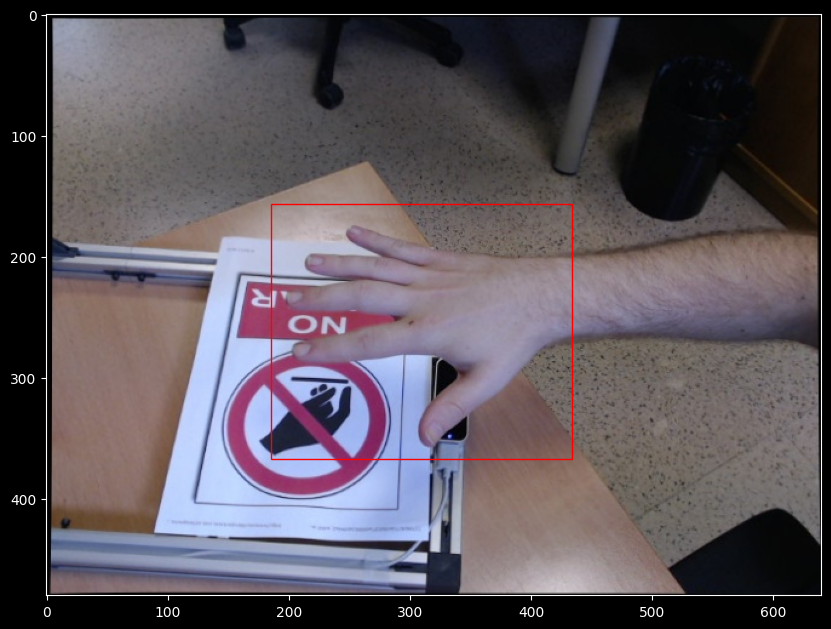

In [13]:
root = '/content/'
i = read_img(imgid[0], root)
j = renderPose(i, kpts[0])
plot_image_with_bboxes(i, boxes[0])

In [14]:
# Import the necessary libraries
import albumentations as A
import tensorflow as tf

def crop_img(img, bbox):
    """
    Crop the image based on the bounding box coordinates.

    Args:
    img (numpy.ndarray): The input image.
    bbox (list): List containing bounding box coordinates [x1, y1, x2, y2].

    Returns:
    numpy.ndarray: Cropped image.
    """
    # Extract the bounding box coordinates and convert them to integers
    x1, y1, x2, y2 = list(map(int, bbox))
    # Crop the image using the bounding box coordinates
    img = img[y1:y2, x1:x2]
    return img

def transform(img, kpt, bbox, Transform = None, img_size = 224):
    """
    Apply a series of transformations to the image and keypoints.

    Args:
    img (numpy.ndarray): The input image.
    kpt (list): List of keypoints.
    bbox (list): List containing bounding box coordinates [x1, y1, x2, y2].
    Transform (albumentations.core.composition.Compose, optional): Predefined albumentations transform. Defaults to None.
    img_size (int, optional): Desired output image size. Defaults to 224.

    Returns:
    tuple: Transformed image and keypoints.
    """
    # Define a shift limit for the ShiftScaleRotate transformation
    a = 0.1
    # Extract the bounding box coordinates and convert them to integers
    x1, y1, x2, y2 = list(map(int, bbox))

    # If no Transform is provided, create a default transformation pipeline
    if not Transform:
        Transform = A.Compose([
            A.Crop(x_min = x1, y_min = y1, x_max = x2, y_max = y2, always_apply=True, p=1.0),  # Crop the image to the bounding box
            A.Resize(img_size, img_size),  # Resize the image to the desired size
            A.Rotate(limit = 80, p = 0.5),  # Randomly rotate the image within the limit
            A.ColorJitter(p=0.5),  # Apply random changes in brightness, contrast, and saturation
            A.ShiftScaleRotate(shift_limit= a, scale_limit=0, rotate_limit=0, p=0.4),  # Apply shift and rotate transformations
#             A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Uncomment if normalization is needed
        ],
        keypoint_params = A.KeypointParams(format="xy", remove_invisible = False)  # Parameters for keypoint transformations
        )

    # Apply the transformations to the image and keypoints
    transformed = Transform(
          image=img,
          keypoints=kpt,
    )

    # Extract the transformed image and keypoints
    img, kpts = transformed['image'], transformed['keypoints']
    # Convert the keypoints to a numpy array
    kpts = np.array(kpts)
    return img, kpts

In [15]:
# Import necessary libraries
import torch
import torch.utils.data as data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import albumentations as A
import os
import cv2 as cv

class IdxGenerator:
    """
    A class to generate train and test indices.
    """
    def __init__(self, n, test_size, seed):
        """
        Initialize the index generator with the number of samples, test size, and random seed.

        Args:
        n (int): Total number of samples.
        test_size (float): Proportion of data to be used for testing.
        seed (int): Random seed for reproducibility.
        """
        idx = np.arange(n).tolist()  # Create a list of indices from 0 to n-1
        np.random.seed(seed)  # Set the random seed
        # Randomly select indices for training data
        self.trainIdx = np.random.choice(idx, size = int(n * (1 - test_size)), replace = False).tolist()
        # The remaining indices are used for testing data
        self.testIdx = list(set(idx).difference(set(self.trainIdx)))
        print(f'Length of training data : {len(self.trainIdx)}')
        print(f'Length of testing data : {len(self.testIdx)}')

class HandPose(data.Dataset):
    """
    A PyTorch Dataset class for hand pose data.
    """
    def __init__(self, df, transform = None, imgSize = 224, subset = 'train', root = None, testSize = 0.2, seed = 0):
        """
        Initialize the dataset with DataFrame, transformations, image size, subset, and other parameters.

        Args:
        df (pd.DataFrame): DataFrame containing the dataset.
        transform (callable, optional): A function/transform to apply to the image and keypoints.
        imgSize (int, optional): The size to which images should be resized. Defaults to 224.
        subset (str, optional): Whether to use 'train' or 'test' subset. Defaults to 'train'.
        root (str, optional): Root directory where images are stored.
        testSize (float, optional): Proportion of data to be used for testing. Defaults to 0.2.
        seed (int, optional): Random seed for reproducibility. Defaults to 0.
        """
        self.transform = transform  # Transformation function or pipeline
        self.imgSize = imgSize  # Desired image size
        self.idxGen = IdxGenerator(df.shape[0], testSize, seed)  # Index generator instance
        self.root = root  # Root directory for image paths

        # Select the subset (training or testing) based on provided indices
        if subset == 'train':
            data = df.iloc[self.idxGen.trainIdx, :]
        else:
            data = df.iloc[self.idxGen.testIdx, :]

        self.data = data.reset_index(drop = True)  # Reset index for the subset data
        self.length = self.data.shape[0]  # Number of samples in the dataset

    def __getitem__(self, ind):
        """
        Get a sample from the dataset.

        Args:
        ind (int): Index of the sample to retrieve.

        Returns:
        tuple: (image, keypoints) where image is a tensor and keypoints are a tensor.
        """
        sdf = self.data.iloc[ind, :]  # Retrieve the sample data at index ind
        imgid, kpts, box = sdf.ImageID, sdf.Keypoints, sdf.Boxes  # Extract image ID, keypoints, and bounding box
        img = plt.imread(os.path.join(self.root, imgid))  # Load the image from the file
        kpts = np.array(kpts).astype(int)  # Convert keypoints to numpy array and ensure they are integers

        # Check if the image is grayscale and convert to RGB if necessary
        if len(img.shape) != 3:
            img = cv.cvtColor(img, cv.COLOR_GRAY2RGB)

        self.height, self.width, self.ch = img.shape  # Get the dimensions of the image

        # Ensure the bounding box coordinates are within the image bounds
        if box[0] > box[2] or box[1] > box[3]:
            print(box, 'before correction', imgid)
        box = [max(0, box[0]), max(0, box[1]), min(self.width, box[2]), min(self.height, box[3])]
        if box[0] > box[2] or box[1] > box[3]:
            print(box, 'after correction', imgid)

        # Apply transformations if provided, otherwise use default transformations
        if self.transform:
            img, kpts = self.transform(img, kpts, box, img_size = self.imgSize)
        else:
            x1, y1, x2, y2 = list(map(int, box))
            transformer = A.Compose([
                A.Crop(x_min = x1, y_min = y1, x_max = x2, y_max = y2, always_apply=True, p=1.0),
                A.Resize(self.imgSize, self.imgSize)
            ],
            keypoint_params = A.KeypointParams(format="xy", remove_invisible = False))
            img, kpts = transform(img, kpts, transformer)

        img = img / 255  # Normalize the image to the range [0, 1]
        img = torch.from_numpy(img.astype(np.float32)).permute(-1, 0, 1)  # Convert image to tensor and rearrange dimensions (C, H, W)
        kpts = (kpts / self.imgSize).flatten().astype(np.float32)  # Normalize and flatten keypoints
        kpts = torch.from_numpy(kpts)  # Convert keypoints to tensor
        return img, kpts

    def orig_size(self, ind):
        """
        Get the original size of the image at a given index.

        Args:
        ind (int): Index of the sample.

        Returns:
        tuple: (height, width, channels) of the image.
        """
        sdf = self.data.iloc[ind, :]  # Retrieve the sample data at index ind
        imgid = sdf.ImageID  # Extract image ID
        img = plt.imread(os.path.join(self.root, imgid))  # Load the image from the file
        return img.shape  # Return the shape of the image

    def __len__(self):
        """
        Get the number of samples in the dataset.

        Returns:
        int: Number of samples in the dataset.
        """
        return self.length

In [16]:
def get_rows(n, c):
    """
    Calculate the number of rows required to arrange `n` images in a grid with `c` columns.

    Args:
    n (int): Total number of images.
    c (int): Number of columns in the grid.

    Returns:
    int: Number of rows needed.
    """
    if n % c == 0:
        return n // c  # If `n` is perfectly divisible by `c`, return the integer division result.
    return (n // c) + 1  # Otherwise, add 1 to cover the remaining images.

In [17]:
def plot_images(data, n = 10, c = 5):
    """
    Plot a grid of images with their keypoints.

    Args:
    data (DataLoader): DataLoader instance providing images and keypoints.
    n (int, optional): Number of images to plot. Defaults to 10.
    c (int, optional): Number of columns in the grid. Defaults to 5.
    """
    r = get_rows(n, c)  # Calculate the number of rows needed for the grid.
    plt.figure(figsize = (c*3, r*4))  # Set the figure size based on the number of columns and rows.
    plt.tight_layout()  # Adjust subplot parameters to give some padding.

    img, kpts = next(iter(data))  # Retrieve a batch of images and keypoints from the DataLoader.
    for ind in range(n):
        image = img[ind].detach().permute(1, -1, 0).numpy().copy()  # Convert tensor to numpy array and rearrange dimensions.
        kpt = (kpts[ind].detach().numpy().reshape(-1, 2) * image.shape[0]).astype(int)  # Reshape and scale keypoints to match image size.
        plt.subplot(r, c, ind + 1)  # Create a subplot for the current image.
        nimage = renderPose(image, kpt)  # Render the image with keypoints.
        plt.imshow(nimage)  # Display the rendered image.
        plt.axis(False)  # Hide the axes.


In [18]:
name = 'data_20/202_webcam_4.jpg'
df[df.ImageID == name]

,ImageID,Keypoints,Boxes,data
74347,data_20/202_webcam_4.jpg,"[[378.4189569377179, 309.43244297005464], [365...","[297, 328, 415, 316]",data_20


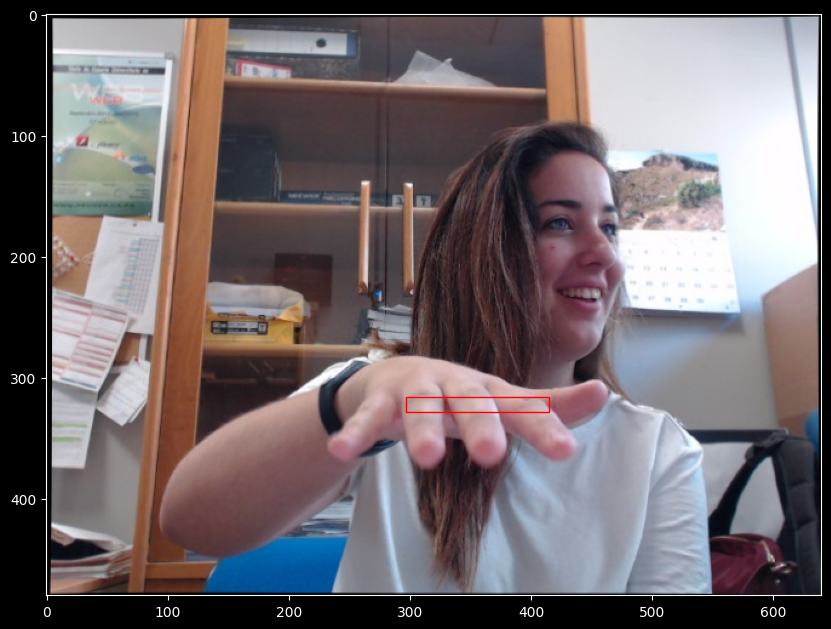

In [19]:
b = [297, 316, 415, 328]
i = read_img(name, root)
plot_image_with_bboxes(i, b)

In [20]:
ndf = df.copy()
ndf[['xmin', 'ymin', 'xmax', 'ymax']] = ndf.Boxes.apply(lambda x: pd.Series(x))

<Figure size 600x600 with 0 Axes>

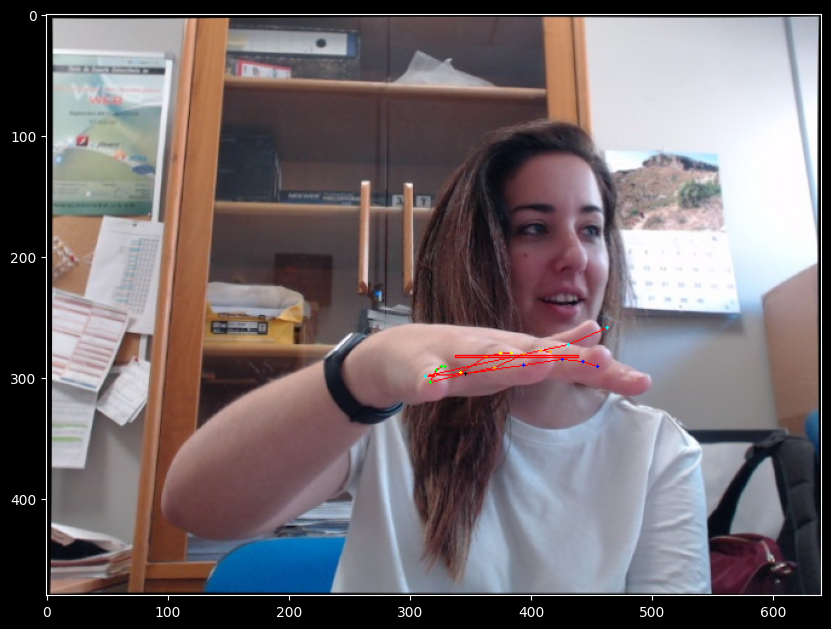

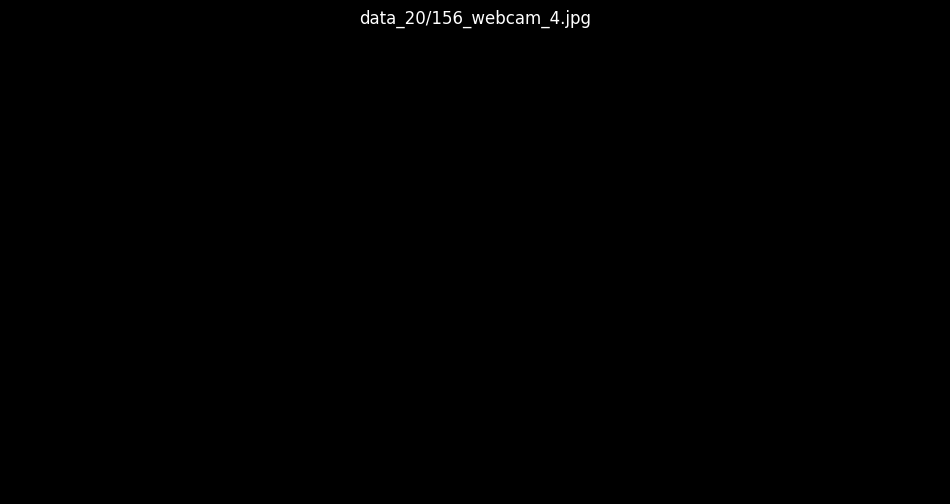

<Figure size 600x600 with 0 Axes>

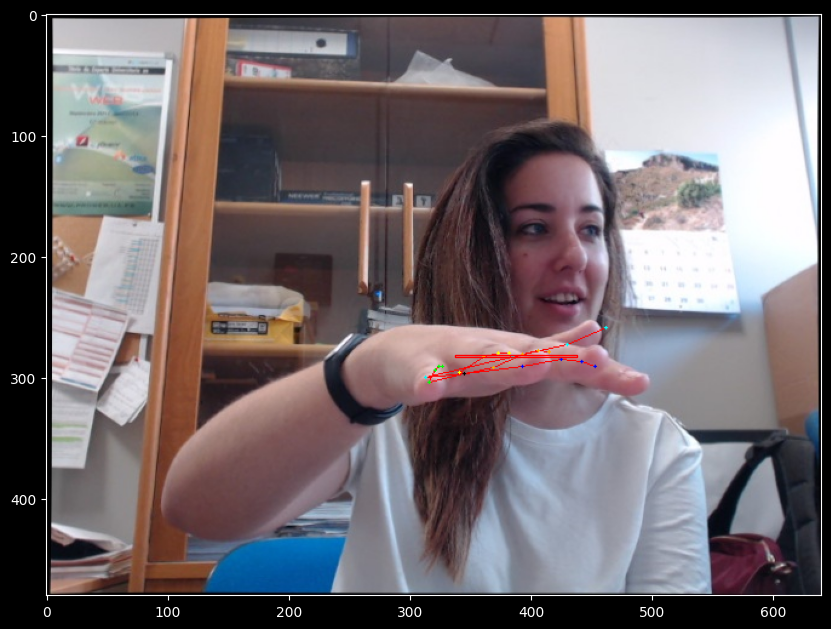

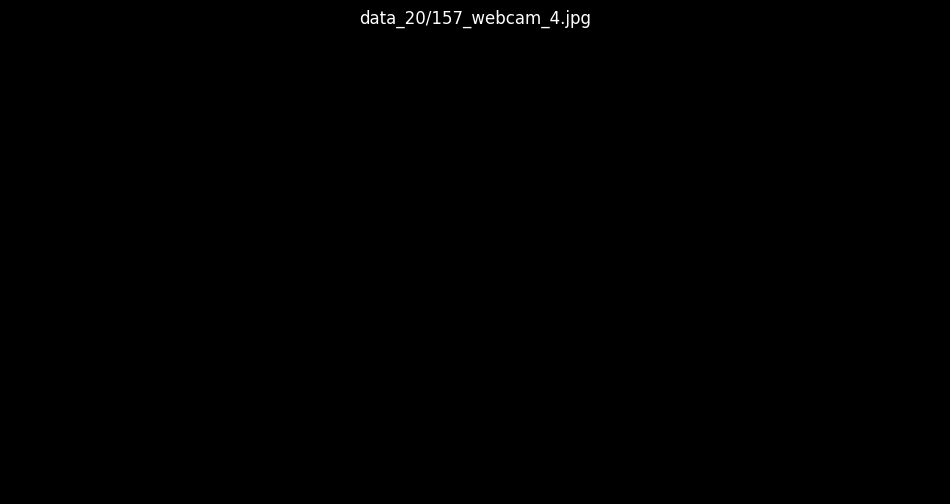

<Figure size 600x600 with 0 Axes>

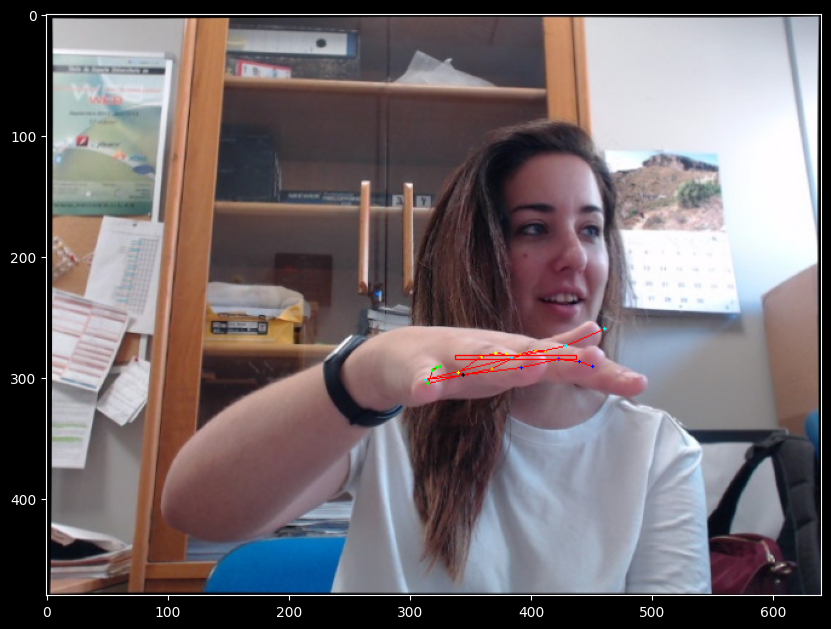

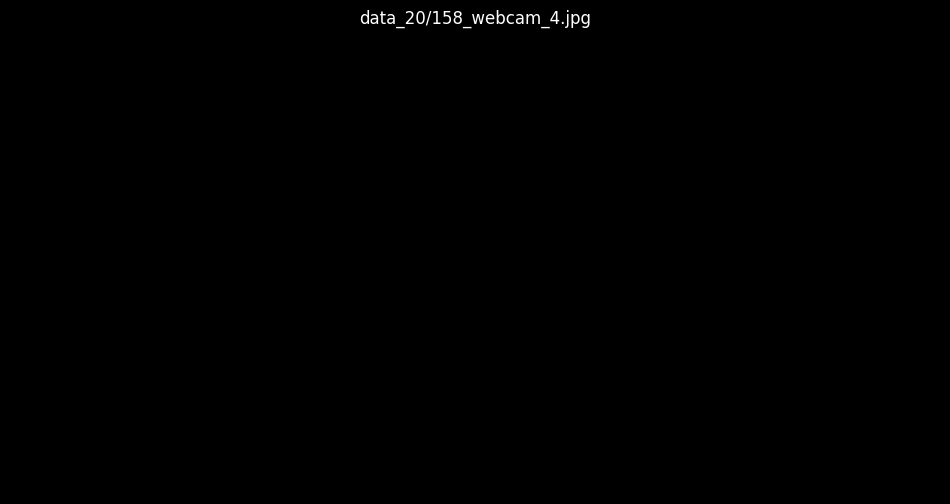

<Figure size 600x600 with 0 Axes>

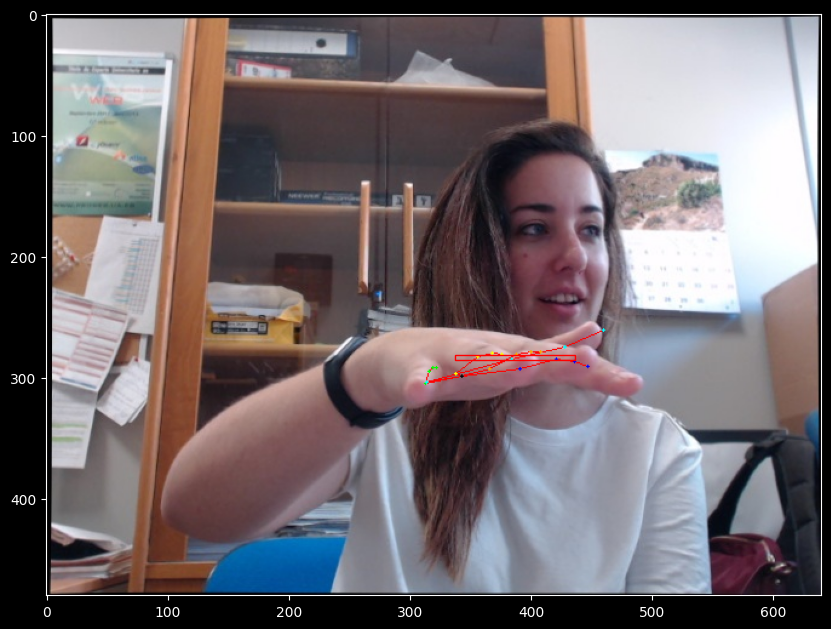

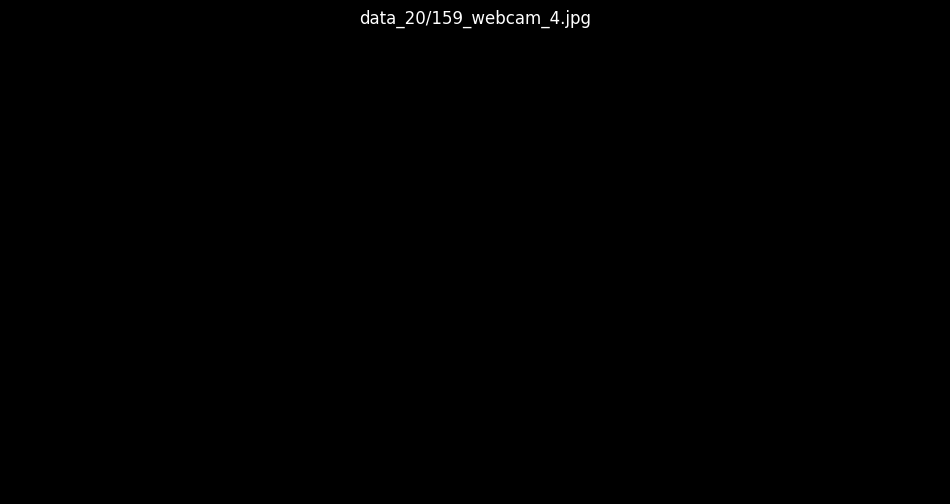

<Figure size 600x600 with 0 Axes>

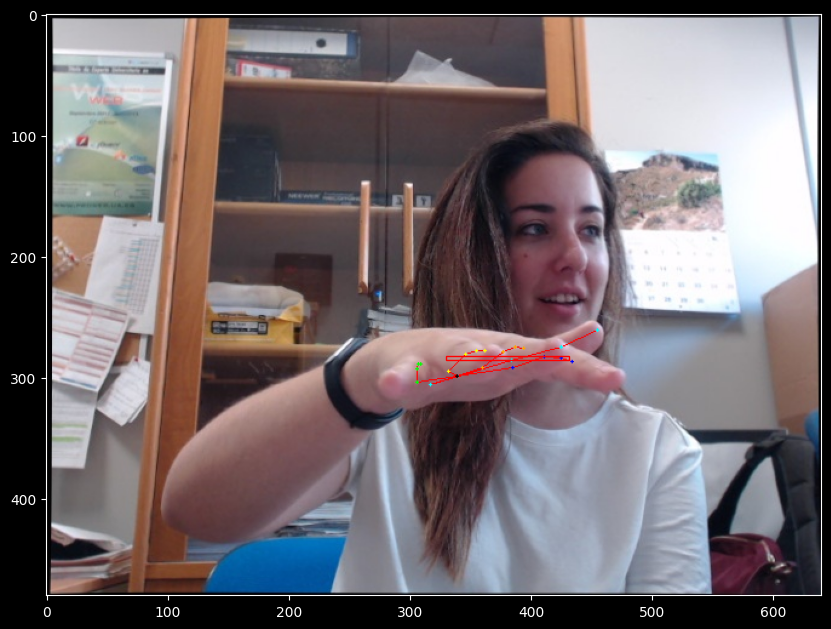

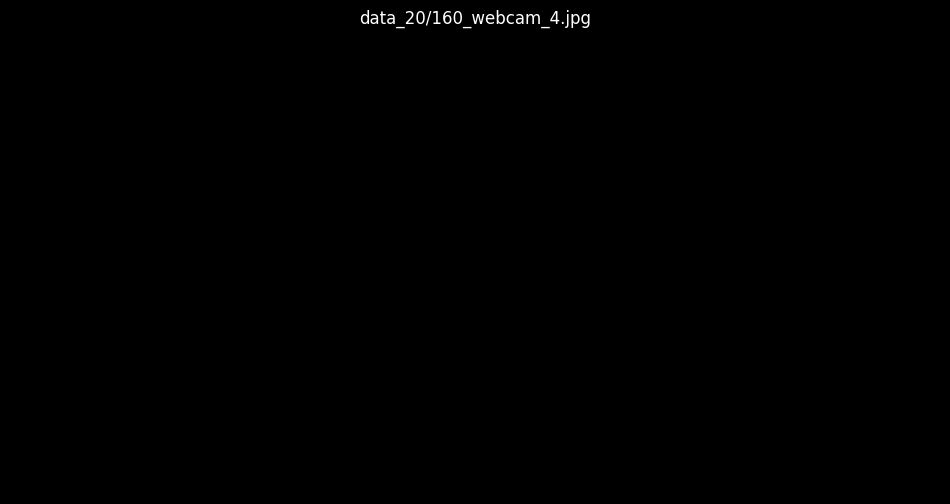

<Figure size 600x600 with 0 Axes>

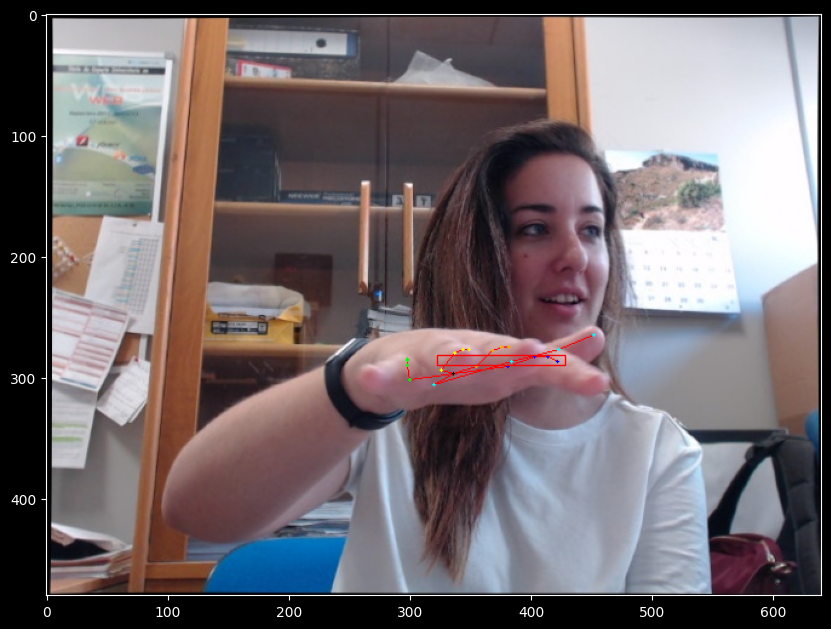

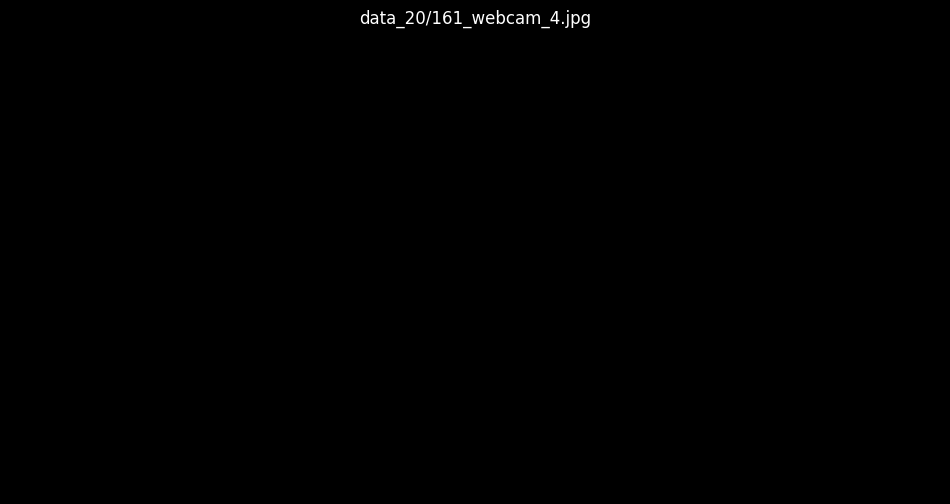

<Figure size 600x600 with 0 Axes>

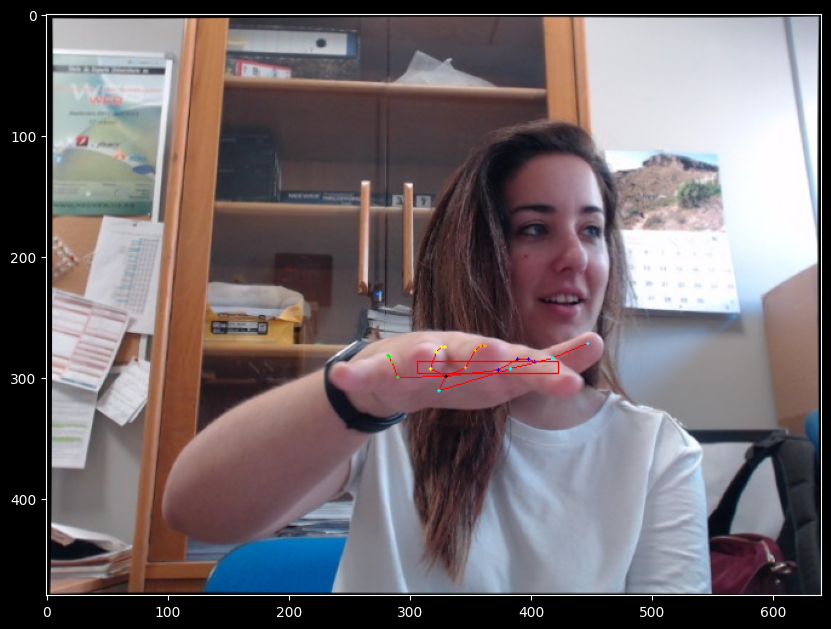

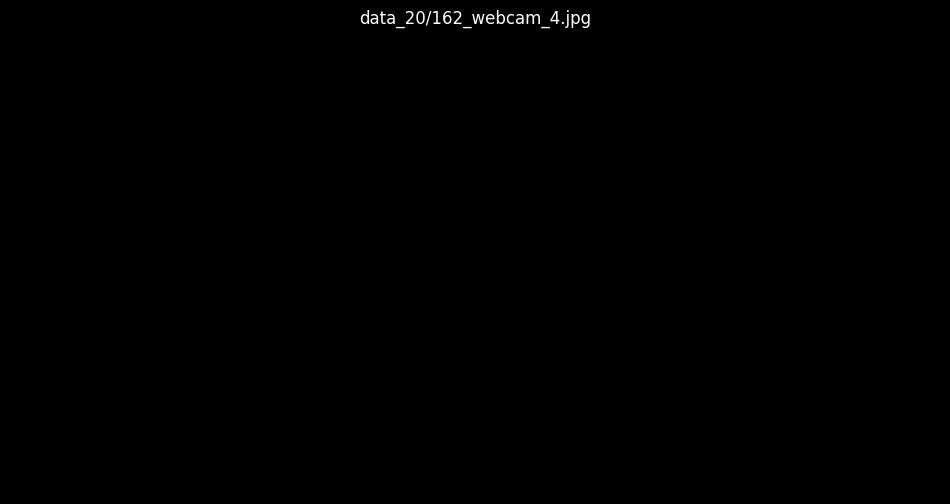

<Figure size 600x600 with 0 Axes>

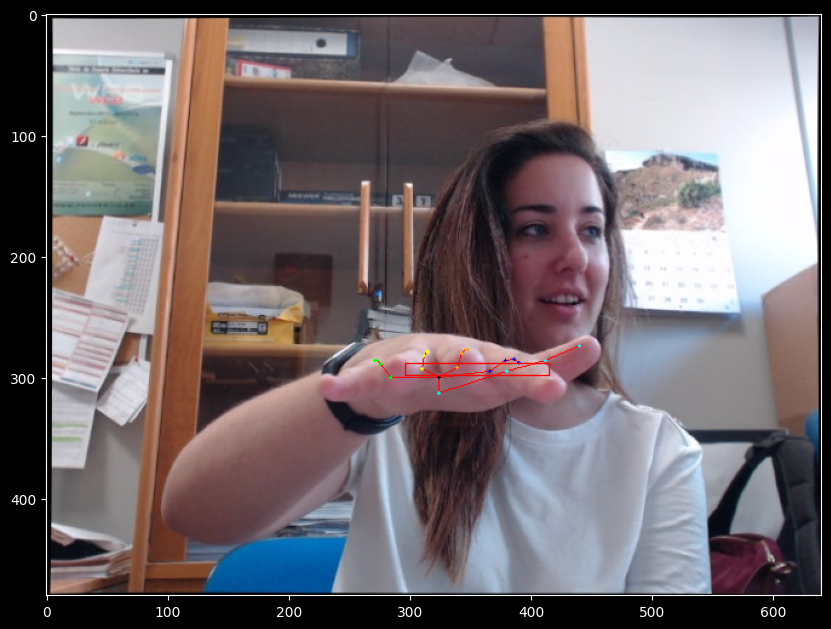

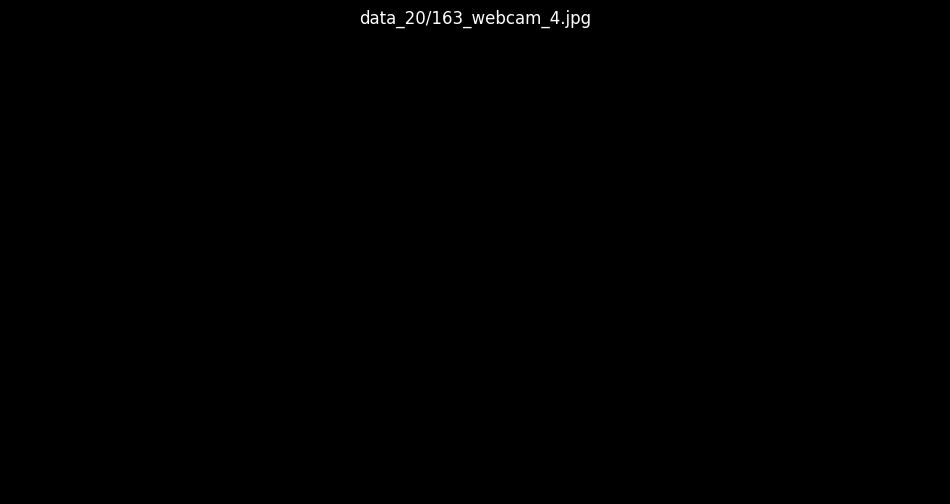

<Figure size 600x600 with 0 Axes>

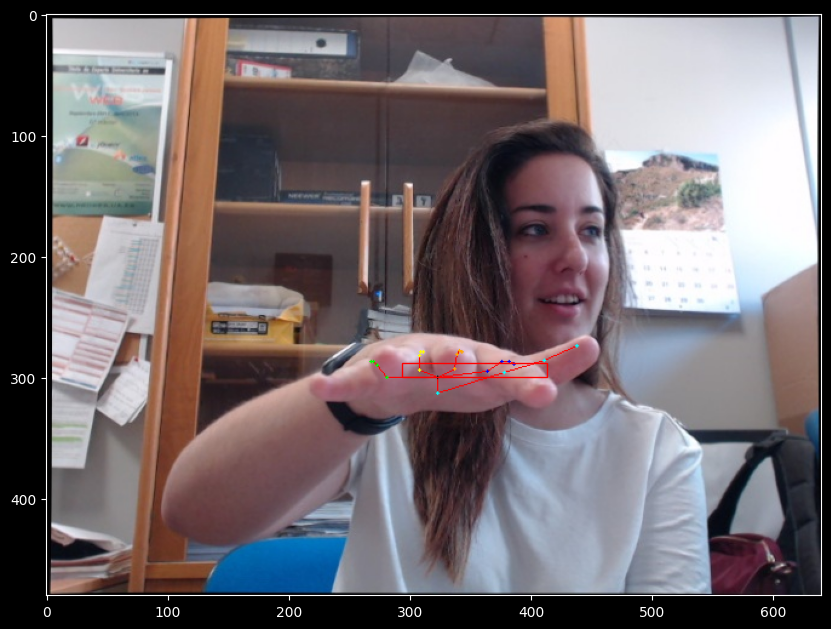

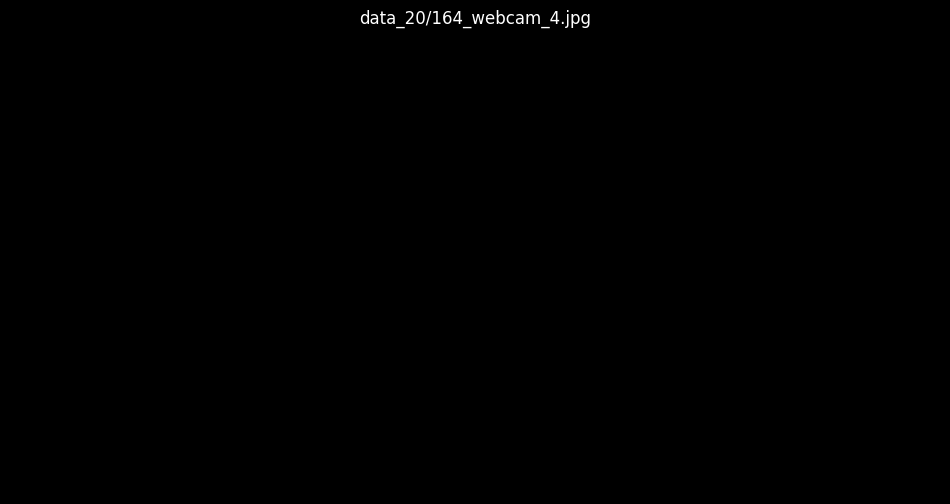

<Figure size 600x600 with 0 Axes>

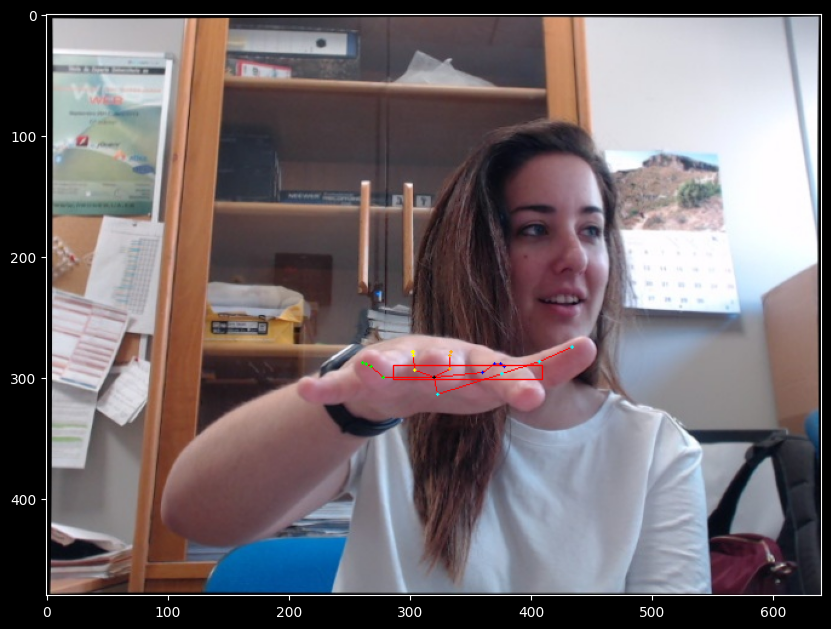

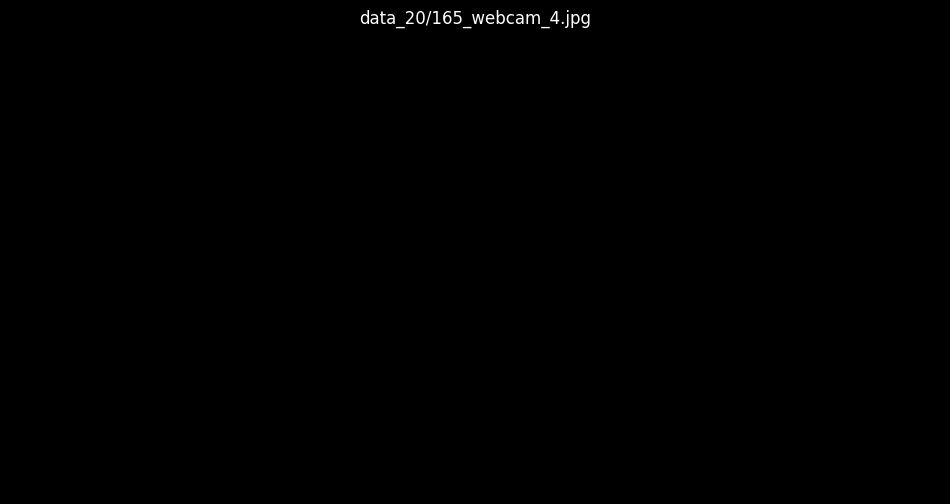

In [21]:
for ind, rdf in ndf[(ndf.ymin > ndf.ymax).values][:10].iterrows():
    plt.figure(figsize = (6,6))
    plot_image_with_bboxes(renderPose(read_img(rdf.ImageID, root), rdf.Keypoints), rdf.Boxes)
    plt.axis(False)
    plt.title(rdf.ImageID)

In [22]:
xidx = ndf[(ndf.xmin > ndf.xmax).values].index.tolist()
yidx = ndf[(ndf.ymin > ndf.ymax).values].index.tolist()
drop_idx = xidx + yidx
print(f'Number of drop index : {len(drop_idx)}')

Number of drop index : 28


In [23]:
df = df.drop(drop_idx).reset_index(drop = True)
print(df.shape[0])
print(ndf.shape[0])

82732
82760


In [24]:
kdf = df.copy()
kdf[['xmin', 'ymin', 'xmax', 'ymax']] = kdf.Boxes.apply(lambda x: pd.Series(x))
kdf.head()

,ImageID,Keypoints,Boxes,data,xmin,ymin,xmax,ymax
0,data_1/0_webcam_1.jpg,"[[271.75619348257266, 267.0390313453443], [319...","[185, 156, 434, 367]",data_1,185,156,434,367
1,data_1/0_webcam_2.jpg,"[[378.5978629466778, 204.89257020049163], [333...","[221, 146, 466, 330]",data_1,221,146,466,330
2,data_1/0_webcam_3.jpg,"[[353.7527955736016, 278.546873340722], [346.1...","[229, 136, 439, 360]",data_1,229,136,439,360
3,data_1/0_webcam_4.jpg,"[[396.14184526907957, 285.43755943968586], [37...","[209, 245, 492, 365]",data_1,209,245,492,365
4,data_1/1_webcam_1.jpg,"[[271.19626825153165, 266.09737706148684], [31...","[184, 154, 433, 366]",data_1,184,154,433,366


In [25]:
# Initialize the index variable for tracking the current row
ind = 0

def error_kpts(x):
    global ind
    # Unpack the list of keypoints into separate x and y coordinates
    x, y = list(zip(*x))
    # Convert x and y coordinates to numpy arrays for efficient processing
    x, y = np.array(x), np.array(y)
    error = False

    # Check if any x-coordinate is outside the bounding box's xmin and xmax
    if (x < kdf.iloc[ind].xmin).sum() > 0 or (x > kdf.iloc[ind].xmax).sum() > 0:
        error = True

    # Check if any y-coordinate is outside the bounding box's ymin and ymax
    if (y < kdf.iloc[ind].ymin).sum() > 0 or (y > kdf.iloc[ind].ymax).sum() > 0:
        error = True

    # Increment the index to move to the next row for the next call
    ind += 1
    # Return whether an error was detected in the keypoints
    return error

# Apply the error_kpts function to each row of the Keypoints column in kdf
# The function will check if the keypoints are within the bounding box defined in each row
ekpts = kdf.Keypoints.apply(lambda x: error_kpts(x))

# Get the indices of rows where the error_kpts function returned True
ind = kdf[ekpts.values].index

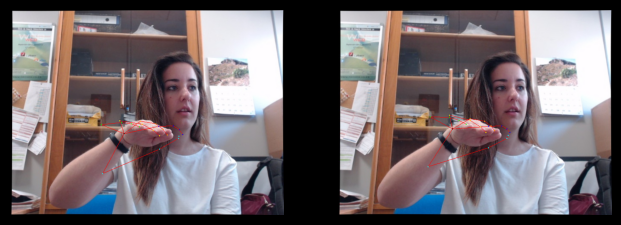

In [26]:
root = '/content/'
iterr = 0
def eplot(ind):
    global iterr
    # Create a subplot in a 1-row, 3-column grid; cycle through columns based on `iterr`
    plt.subplot(1, 3, max(1, (iterr + 1) % 3))

    # Retrieve the current row of the DataFrame using the index provided
    q = kdf.iloc[ind[iterr]]

    # Extract the bounding box and keypoints from the current row
    b = q.Boxes

    # Read the image from the path specified in the DataFrame, render it with keypoints,
    # and convert the result to an 8-bit unsigned integer format for display
    plt.imshow(renderPose(read_img(q.ImageID, root), q.Keypoints).astype(np.uint8))

    # Hide the axis for a cleaner display of the image
    plt.axis(False)

    # Increment the iterator to move to the next subplot position in the next call
    iterr += 1

# Call `eplot` function three times to plot three images with keypoints in a single row of subplots
eplot(ind)
eplot(ind)
eplot(ind)


In [27]:
df = df.drop(ind.tolist()).reset_index(drop = True)
df.shape

(82253, 4)

In [28]:
root = '/content/'
iroot = os.path.join(root, 'annotated_frames')
HP = HandPose(df,transform, root = iroot, testSize = .1, subset = 'train')
Data = data.DataLoader(HP, shuffle = True, batch_size = 128)
HP_val = HandPose(df,transform, root = iroot, testSize = .1, subset = 'validation')
Data_val = data.DataLoader(HP, shuffle = True, batch_size = 128)

Length of training data : 74027
Length of testing data : 8226
Length of training data : 74027
Length of testing data : 8226


# MODELLING

In [29]:
!pip install -q pytorch-lightning torchbnn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 866.2/866.2 kB 2.1 MB/s eta 0:00:00


In [30]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from pytorch_lightning import Trainer, Callback
import albumentations as A
import numpy as np
from tqdm import tqdm
import pytorch_lightning as pl
from torch import optim
import torchvision.models as models
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import mean_squared_error, mean_absolute_error
import cv2
import torchbnn as bnn


class BayesianMobNet(pl.LightningModule):
    def __init__(self, k=21*2):
        super(BayesianMobNet, self).__init__()
        torch.cuda.empty_cache()

        # Load a pre-trained model
        self.model = models.mobilenet_v2(pretrained=True)
        self.model.classifier[1] = bnn.BayesLinear(prior_mu=0, prior_sigma=1e-4, in_features=self.model.last_channel, out_features=k)

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        imgs, kpts = batch
        preds = self(imgs)

        # Compute projection errors and trust scores
        projection_errors = compute_projection_errors(preds, kpts)
        trust_scores = compute_trust(projection_errors)

        # Weighted MSE loss
        loss = self.weighted_mse_loss(preds, kpts, trust_scores)
        self.log('train_loss', loss)
        return loss

    def validation_step(self, batch, batch_idx):
        imgs, kpts = batch
        preds = self(imgs)

        # Compute projection errors and trust scores
        projection_errors = compute_projection_errors(preds, kpts)
        trust_scores = compute_trust(projection_errors)

        # Weighted MSE loss
        loss = self.weighted_mse_loss(preds, kpts, trust_scores)
        self.log('val_loss', loss)
        return loss

    def weighted_mse_loss(self, pred, target, weight):
        weight = torch.tensor(weight, device=pred.device)
        weight = weight.unsqueeze(0).unsqueeze(0).expand_as(target)
        loss = (weight * (pred - target) ** 2).mean()
        return loss

    def configure_optimizers(self):
        optimizer = optim.Adam(self.parameters(), lr=1e-3)
        return optimizer

def tensor_to_numpy(img):
    img = img.detach().cpu().numpy()
    img = np.transpose(img, (1, 2, 0))  # Convert from (C, H, W) to (H, W, C)
    img = img * 255  # Scale to [0, 255]
    img = img.astype(np.uint8)
    return img

def assess_image_clarity(img):
    img = tensor_to_numpy(img)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    variance_of_laplacian = cv2.Laplacian(gray, cv2.CV_64F).var()
    return variance_of_laplacian

def estimate_noise(img):
    img = tensor_to_numpy(img)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    noise = gray - cv2.medianBlur(gray, 3)
    noise_level = np.var(noise)
    return noise_level

def detect_occlusions(kpts, threshold=0.5):
    if kpts.ndim == 1:
        kpts = kpts.unsqueeze(0)
    occlusions = (kpts[:, 2] < threshold).sum().item()
    return occlusions

def evaluate_historical_performance(preds, targets):
    preds_flat = preds.view(-1, preds.shape[-1]).detach().cpu().numpy()
    targets_flat = targets.view(-1, targets.shape[-1]).detach().cpu().numpy()

    mse = mean_squared_error(targets_flat, preds_flat)
    mae = mean_absolute_error(targets_flat, preds_flat)

    return mse, mae

def compute_prediction_confidence(preds):
    confidence = preds.var(dim=0).mean().item()
    return confidence

def compute_cross_view_consistency(preds_views):
    # compute the variance of the predictions across views
    consistency = preds_views.var(dim=0).mean().item()
    return consistency

def compute_trust(metrics):
    mse, mae, pck, mje, confidence, consistency = metrics
    # Combine metrics to compute trust score; adjust weights as needed
    trust_score = mse + mae + pck + mje + confidence + consistency
    return trust_score

def compute_projection_errors(preds, kpts):
    # preds and kpts have shape (batch_size, num_keypoints * 2)
    preds = preds.view(preds.size(0), -1, 2)  # Reshape to (batch_size, num_keypoints, 2)
    kpts = kpts.view(kpts.size(0), -1, 2)  # Reshape to (batch_size, num_keypoints, 2)
    # Compute the Euclidean distance between predicted and true keypoints
    errors = torch.sqrt(torch.sum((preds - kpts) ** 2, dim=-1))  # Shape: (batch_size, num_keypoints)
    # Average error per image
    mean_errors = errors.mean(dim=-1)  # Shape: (batch_size,)

    return mean_errors


def compute_pck(preds, kpts, threshold=0.2):
    """
    Compute the Percentage of Correct Keypoints (PCK).

    Args:
        preds (torch.Tensor): Predicted keypoints of shape (batch_size, num_keypoints * 2)
        kpts (torch.Tensor): Ground truth keypoints of shape (batch_size, num_keypoints * 2)
        threshold (float): The normalized distance threshold (e.g., 0.2 means 20% of the image size)

    Returns:
        pck (float): The percentage of keypoints that are within the threshold distance
    """
    # Reshape to (batch_size, num_keypoints, 2)
    preds = preds.view(preds.size(0), -1, 2)
    kpts = kpts.view(kpts.size(0), -1, 2)

    # Compute the Euclidean distance between predicted and true keypoints
    dists = torch.sqrt(torch.sum((preds - kpts) ** 2, dim=-1))  # Shape: (batch_size, num_keypoints)

    # Compute the threshold distance based on the image size
    bbox_size = torch.max(kpts, dim=1)[0] - torch.min(kpts, dim=1)[0]
    threshold_dist = threshold * torch.max(bbox_size, dim=-1)[0]

    # Compute the percentage of keypoints within the threshold
    correct_keypoints = (dists < threshold_dist.unsqueeze(1)).float()
    pck = correct_keypoints.mean().item()

    return pck

def compute_mje(preds, kpts):
    """
    Compute the Mean Joint Error (MJE).

    Args:
        preds (torch.Tensor): Predicted keypoints of shape (batch_size, num_keypoints * 2)
        kpts (torch.Tensor): Ground truth keypoints of shape (batch_size, num_keypoints * 2)

    Returns:
        mje (float): The mean Euclidean distance between the predicted keypoints and ground truth keypoints
    """
    # Reshape to (batch_size, num_keypoints, 2)
    preds = preds.view(preds.size(0), -1, 2)
    kpts = kpts.view(kpts.size(0), -1, 2)

    # Compute the Euclidean distance between predicted and true keypoints
    errors = torch.sqrt(torch.sum((preds - kpts) ** 2, dim=-1))  # Shape: (batch_size, num_keypoints)

    # Mean joint error
    mje = errors.mean().item()

    return mje



class TrustAwareBayesianMobNet(BayesianMobNet):
    def training_step(self, batch, batch_idx):
        imgs, kpts = batch
        preds = self(imgs)

        # Quality Assessment
        clarity_scores = [assess_image_clarity(img) for img in imgs]
        noise_levels = [estimate_noise(img) for img in imgs]
        occlusions = [detect_occlusions(kpt) for kpt in kpts]

        # Historical Performance
        mse, mae = evaluate_historical_performance(preds, kpts)

        # Compute PCK and MJE
        pck = compute_pck(preds, kpts)
        mje = compute_mje(preds, kpts)

        # Prediction Confidence
        confidence = compute_prediction_confidence(preds)

        # Cross-View Consistency (assume multiple views are passed in batch)
        consistency = compute_cross_view_consistency(preds)

        # Combine to compute trust scores
        trust_scores = compute_trust([mse, mae, pck, mje, confidence, consistency])

        # Weighted MSE loss
        loss = self.weighted_mse_loss(preds, kpts, trust_scores)
        self.log('train_loss', loss)
        self.log('train_mse', mse)
        self.log('train_mae', mae)
        self.log('train_clarity', np.mean(clarity_scores))
        self.log('train_noise', np.mean(noise_levels))
        self.log('train_occlusions', np.mean(occlusions))
        self.log('train_confidence', confidence)
        self.log('train_consistency', consistency)
        self.log('train_pck', pck)
        self.log('train_mje', mje)
        return loss

    def validation_step(self, batch, batch_idx):
        imgs, kpts = batch
        preds = self(imgs)

        # Quality Assessment
        clarity_scores = [assess_image_clarity(img) for img in imgs]
        noise_levels = [estimate_noise(img) for img in imgs]
        occlusions = [detect_occlusions(kpt) for kpt in kpts]

        # Historical Performance
        mse, mae = evaluate_historical_performance(preds, kpts)

        # Compute PCK and MJE
        pck = compute_pck(preds, kpts)
        mje = compute_mje(preds, kpts)

        # Prediction Confidence
        confidence = compute_prediction_confidence(preds)

        # Cross-View Consistency (assume multiple views are passed in batch)
        consistency = compute_cross_view_consistency(preds)

        # Combine to compute trust scores
        trust_scores = compute_trust([mse, mae, pck, mje, confidence, consistency])

        # Weighted MSE loss
        loss = self.weighted_mse_loss(preds, kpts, trust_scores)
        self.log('val_loss', loss)
        self.log('val_mse', mse)
        self.log('val_mae', mae)
        self.log('val_clarity', np.mean(clarity_scores))
        self.log('val_noise', np.mean(noise_levels))
        self.log('val_occlusions', np.mean(occlusions))
        self.log('val_confidence', confidence)
        self.log('val_consistency', consistency)
        self.log('val_pck', pck)
        self.log('val_mje', mje)
        return loss

from torch.utils.data import DataLoader

root = '/content/'
iroot = os.path.join(root, 'annotated_frames')

HP = HandPose(df, transform, root=iroot, testSize=0.1, subset='train')
Data = DataLoader(HP, shuffle=True, batch_size=128)

HP_val = HandPose(df, transform, root=iroot, testSize=0.1, subset='validation')
Data_val = DataLoader(HP_val, shuffle=False, batch_size=128)


Length of training data : 74027
Length of testing data : 8226
Length of training data : 74027
Length of testing data : 8226


In [31]:
import pytorch_lightning as pl

class MetricsLogger(pl.Callback):
    def __init__(self):
        super().__init__()
        self.metrics = {
            'train_loss': [], 'train_mse': [], 'train_mae': [],
            'train_clarity': [], 'train_noise': [], 'train_occlusions': [],
            'train_confidence': [], 'train_consistency': [], 'train_pck': [], 'train_mje': [],
            'val_loss': [], 'val_mse': [], 'val_mae': [],
            'val_clarity': [], 'val_noise': [], 'val_occlusions': [],
            'val_confidence': [], 'val_consistency': [], 'val_pck': [], 'val_mje': []
        }
        self.epochs = 0

    def on_train_epoch_end(self, trainer, pl_module):
        metrics = trainer.callback_metrics
        epoch = trainer.current_epoch
        print(f"Epoch {epoch} - Train Metrics: "
              f"Loss: {metrics['train_loss'].item()}, "
              f"MSE: {metrics['train_mse'].item()}, "
              f"MAE: {metrics['train_mae'].item()}, "
              f"PCK: {metrics['train_pck'].item()}, "
              f"MJE: {metrics['train_mje'].item()}, "
              f"Clarity: {metrics['train_clarity'].item()}, "
              f"Noise: {metrics['train_noise'].item()}, "
              f"Occlusions: {metrics['train_occlusions'].item()}, "
              f"Confidence: {metrics['train_confidence'].item()}, "
              f"Consistency: {metrics['train_consistency'].item()}\n\n")
        self.epochs += 1

    def on_validation_epoch_end(self, trainer, pl_module):
        metrics = trainer.callback_metrics
        epoch = trainer.current_epoch
        print(f"Epoch {epoch} - Validation Metrics: "
              f"Loss: {metrics['val_loss'].item()}, "
              f"MSE: {metrics['val_mse'].item()}, "
              f"MAE: {metrics['val_mae'].item()}, "
              f"PCK: {metrics['val_pck'].item()}, "
              f"MJE: {metrics['val_mje'].item()}, "
              f"Clarity: {metrics['val_clarity'].item()}, "
              f"Noise: {metrics['val_noise'].item()}, "
              f"Occlusions: {metrics['val_occlusions'].item()}, "
              f"Confidence: {metrics['val_confidence'].item()}, "
              f"Consistency: {metrics['val_consistency'].item()}")

# Create an instance of MetricsLogger
metrics_logger = MetricsLogger()

# Initialize and train the model
model = TrustAwareBayesianMobNet()
trainer = pl.Trainer(max_epochs=3, precision=16, callbacks=[metrics_logger])
trainer.fit(model, Data, Data_val)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 64.8MB/s]
/usr/local/lib/python3.10/dist-packages/lightning_fabric/connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your pre

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Epoch 0 - Validation Metrics: Loss: 1.025048111765806, MSE: 0.491428017616272, MAE: 0.5925639271736145, PCK: 0.01320684514939785, MJE: 0.9133567810058594, Clarity: 173.79446411132812, Noise: 8529.8955078125, Occlusions: 0.3359375, Confidence: 0.0376434326171875, Consistency: 0.0376434326171875


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 0 - Validation Metrics: Loss: 0.007509441363753427, MSE: 0.006809848360717297, MAE: 0.05373615771532059, PCK: 0.8798583745956421, MJE: 0.08451817184686661, Clarity: 158.91905212402344, Noise: 8721.29296875, Occlusions: 0.36032092571258545, Confidence: 0.03484180569648743, Consistency: 0.03484180569648743
Epoch 0 - Train Metrics: Loss: 0.008742528867381076, MSE: 0.008122089318931103, MAE: 0.06595773249864578, PCK: 0.8239202499389648, MJE: 0.10343782603740692, Clarity: 178.1298828125, Noise: 8901.3603515625, Occlusions: 0.39534884691238403, Confidence: 0.0374755859375, Consistency: 0.0374755859375




Validation: |          | 0/? [00:00<?, ?it/s]

Epoch 1 - Validation Metrics: Loss: 0.005796386379514386, MSE: 0.005125399213284254, MAE: 0.04452678933739662, PCK: 0.925792932510376, MJE: 0.07014545798301697, Clarity: 158.60252380371094, Noise: 8711.21875, Occlusions: 0.36323851346969604, Confidence: 0.0350298173725605, Consistency: 0.0350298173725605
Epoch 1 - Train Metrics: Loss: 0.00632271961296539, MSE: 0.0056449780240654945, MAE: 0.05650867149233818, PCK: 0.8970099687576294, MJE: 0.08924209326505661, Clarity: 106.18370819091797, Noise: 8524.2451171875, Occlusions: 0.3255814015865326, Confidence: 0.03582763671875, Consistency: 0.03582763671875




Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


Epoch 2 - Validation Metrics: Loss: 0.005066155216630018, MSE: 0.004464277531951666, MAE: 0.040858421474695206, PCK: 0.9368784427642822, MJE: 0.06434576958417892, Clarity: 158.61459350585938, Noise: 8715.814453125, Occlusions: 0.35764649510383606, Confidence: 0.03844676911830902, Consistency: 0.03844676911830902
Epoch 2 - Train Metrics: Loss: 0.0058290495807453435, MSE: 0.00521622970700264, MAE: 0.04762668162584305, PCK: 0.921373188495636, MJE: 0.0753961130976677, Clarity: 164.37034606933594, Noise: 8841.66796875, Occlusions: 0.27906978130340576, Confidence: 0.033935546875, Consistency: 0.033935546875




In [32]:
torch.save(model.state_dict(), 'bnn.pt')

## Inference

In [33]:
def predict_(model, img, bbox, IMG_SIZE = 224):
    x1,y1,x2,y2 = list(map(int, bbox))
    transformer = A.Compose([
        A.Crop(x_min = x1, y_min = y1, x_max = x2, y_max = y2, always_apply=True, p=1.0),
        A.Resize(IMG_SIZE, IMG_SIZE)])
    img = (transformer(image = img)['image'] / 255).astype(np.float32)
    img = torch.from_numpy(img).permute(-1, 0, 1)
    img = torch.unsqueeze(img, dim = 0)
    model.eval()
    with torch.no_grad():
        preds = torch.squeeze(model(img))
    return torch.squeeze(img.detach()).permute(1,-1,0).numpy().copy(), (preds.reshape(-1, 2).numpy() * IMG_SIZE).astype(np.uint32)

In [34]:
tidx = IdxGenerator(df.shape[0], .1, 0).testIdx
tdf = df.iloc[tidx]
tdf.head()

Length of training data : 74027
Length of testing data : 8226


,ImageID,Keypoints,Boxes,data
10,data_1/2_webcam_3.jpg,"[[352.8275527518978, 278.9541831366298], [344....","[230, 136, 438, 361]",data_1
32779,data_9/64_webcam_4.jpg,"[[425.7878086116697, 184.27241379250026], [378...","[254, 79, 497, 332]",data_9
65547,data_17/110_webcam_4.jpg,"[[383.3428009806578, 276.22235275501885], [361...","[255, 231, 409, 369]",data_17
13,data_1/3_webcam_2.jpg,"[[377.44452738851135, 200.04488858665835], [33...","[218, 137, 466, 324]",data_1
32787,data_9/66_webcam_4.jpg,"[[422.91153484920545, 183.28985168544386], [37...","[258, 83, 496, 320]",data_9


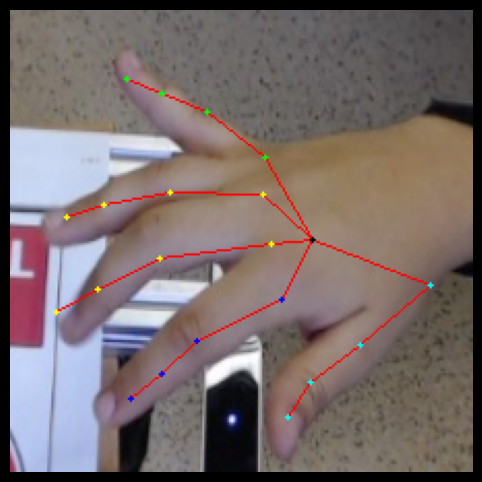

In [35]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

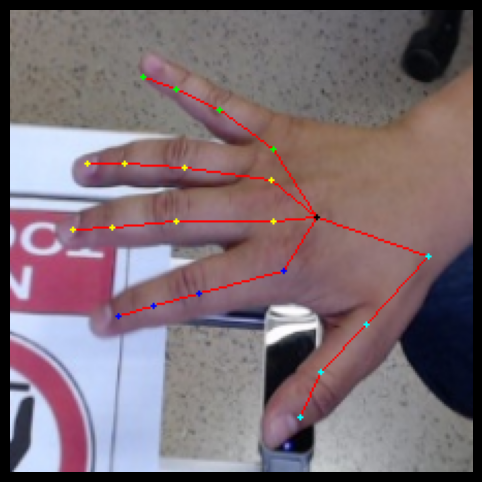

In [36]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

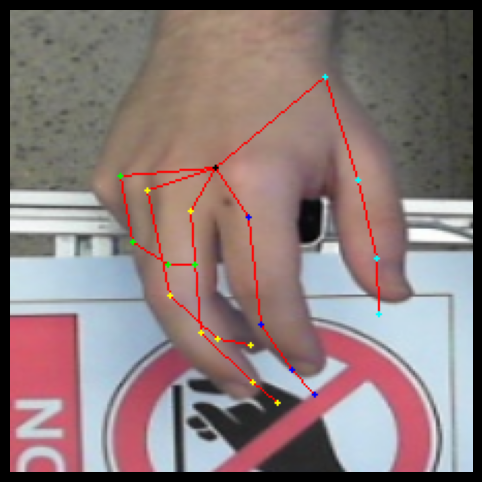

In [37]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

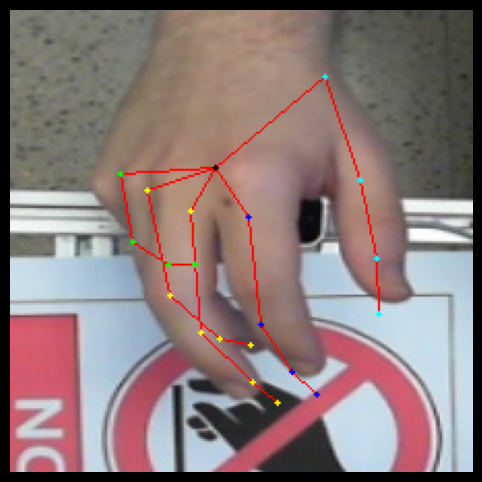

In [48]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

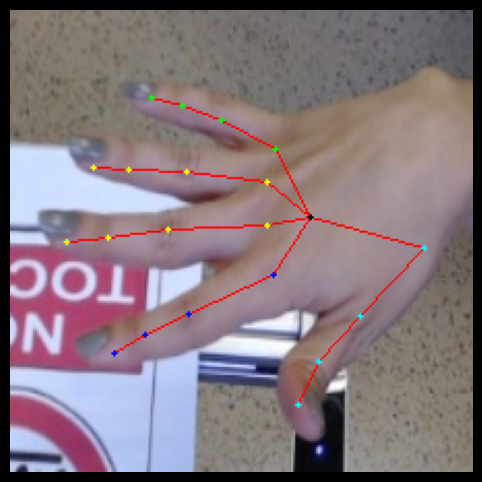

In [55]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

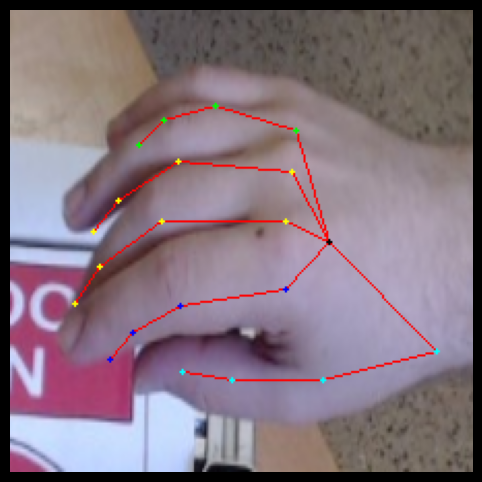

In [56]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

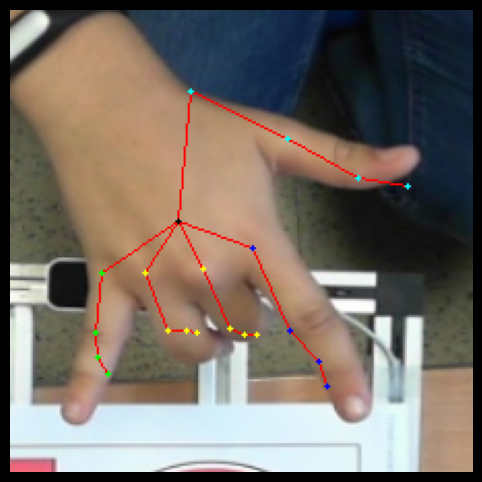

In [59]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

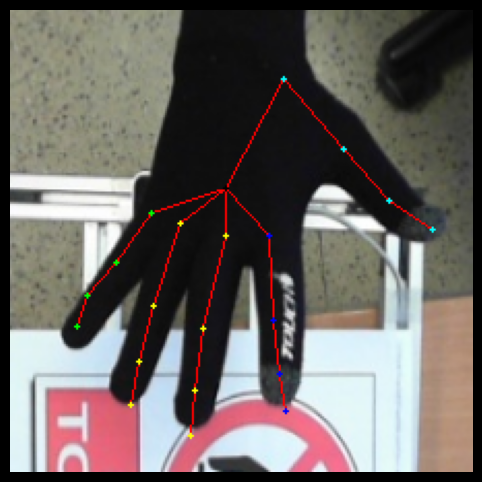

In [64]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

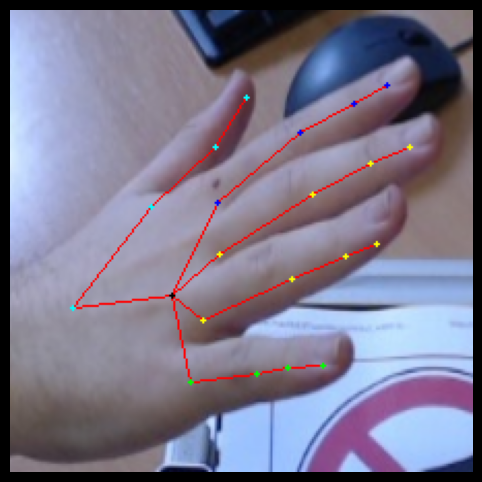

In [68]:
sdf = tdf.sample(1)
img, kpts = predict_(model, read_img(sdf.ImageID.values[0], root), sdf.Boxes.values[0])
plt.imshow(renderPose(img, kpts))
plt.axis(False);

## Overall Eval

In [44]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
from tqdm import tqdm

def RMSE(true, preds):
    return np.sqrt(np.mean(np.square(true - preds)))

def MAE(true, preds):
    return mean_absolute_error(true, preds)

def MSE(true, preds):
    return mean_squared_error(true, preds)

def pred_batches(loader, num_batches=1):
    tkpts = []
    pkpts = []
    iterr = 0
    for batch in loader:
        if iterr >= num_batches:
            break
        img, kpts = batch
        model.eval()
        with torch.no_grad():
            kpts = kpts.detach().cpu().numpy()
            preds = model(img).detach().cpu().numpy()
            for i in tqdm(range(preds.shape[0])):
                tkpts.append(kpts[i])
                pkpts.append(preds[i])
        iterr += 1

    true = np.array(tkpts)
    preds = np.array(pkpts)
    print(true.shape, preds.shape)

    # Overall metrics
    print(f'Total RMSE : {RMSE(true, preds)}')
    print(f'Total MAE : {MAE(true, preds)}')
    print(f'Total MSE : {MSE(true, preds)}')
    print(f'Total PCK : {compute_pck(torch.from_numpy(preds), torch.from_numpy(true))}')
    print(f'Total MJE : {compute_mje(torch.from_numpy(preds), torch.from_numpy(true))}')

    root_lbls = ['index', 'middle', 'pinky', 'ring', 'thumb', 'center']
    st = 0
    for i in range(6):
        curr_finger = root_lbls[i]
        ed = st + 4
        strue = true[:, st:ed]
        spreds = preds[:, st:ed]
        print(f'{curr_finger} finger RMSE : {RMSE(strue, spreds)}')
        print(f'{curr_finger} finger MAE : {MAE(strue, spreds)}')
        print(f'{curr_finger} finger MSE : {MSE(strue, spreds)}')
        print(f'{curr_finger} finger PCK : {compute_pck(torch.from_numpy(spreds), torch.from_numpy(strue))}')
        print(f'{curr_finger} finger MJE : {compute_mje(torch.from_numpy(spreds), torch.from_numpy(strue))}')
        st = ed

In [45]:
HP_val = HandPose(df,transform, root = iroot, testSize = .1, subset = 'validation')
Data_val = data.DataLoader(HP, shuffle = False, batch_size = 128)
pred_batches(Data_val, 2)

Length of training data : 74027
Length of testing data : 8226


100%|██████████| 128/128 [00:00<00:00, 400649.93it/s]


(256, 42) (256, 42)
Total RMSE : 0.06055459380149841
Total MAE : 0.04091312363743782
Total MSE : 0.0036668588872998953
Total PCK : 0.937127947807312
Total MJE : 0.06419471651315689
index finger RMSE : 0.04898063465952873
index finger MAE : 0.034276217222213745
index finger MSE : 0.0023991025518625975
index finger PCK : 0.435546875
index finger MJE : 0.0539880096912384
middle finger RMSE : 0.07945144921541214
middle finger MAE : 0.05251603573560715
middle finger MSE : 0.006312532816082239
middle finger PCK : 0.041015625
middle finger MJE : 0.08234207332134247
pinky finger RMSE : 0.04457776993513107
pinky finger MAE : 0.03179725632071495
pinky finger MSE : 0.001987177412956953
pinky finger PCK : 0.509765625
pinky finger MJE : 0.05010587349534035
ring finger RMSE : 0.07074688374996185
ring finger MAE : 0.049333956092596054
ring finger MSE : 0.005005122162401676
ring finger PCK : 0.0859375
ring finger MJE : 0.07715070247650146
thumb finger RMSE : 0.04776863381266594
thumb finger MAE : 0.03